In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.mplot3d import Axes3D
import scipy.special as sp
from scipy.optimize import curve_fit
import slmsuite.holography.toolbox as toolbox

In [2]:
# Fit functions

# Gaussian
def gaussian(x, a, w):
    return a*np.exp(-2*x**2/w**2)

# Shifted Gaussian
def gaussian_sh(x, a, w, x0):
    return a*np.exp(-2*(x-x0)**2/w**2)

# 2D Gaussian
def gaussian2D(X, a, wx, x0, wy, y0):
    x, y = X
    g =  a*np.exp((-2 * ((x-x0)**2/wx**2)) + (-2 * ((y-y0)**2/wy**2)))
    return g.ravel()

def splot2(axis=None, img=None, xaxis=True):
    data = img[:, 0] # to use len(data)
    pixelnum = np.arange(0, len(data))
    pns = pixelnum # pixelnum no shift
    shift =  len(data)/2
    pixelnum = pixelnum-shift
    # Shift to actual length scale.
    pixelsize = 3.450 # um
    magnification = 1
    actual_length = pixelsize/magnification # in um
    larr = actual_length*pixelnum


    xm, ym = np.meshgrid(larr, larr)

    # Also plot the theoretical on-axis PSF
    popt, pcov = curve_fit(gaussian2D, (xm, ym), img[:, :].ravel())
    residuals = img[:, :].ravel() - gaussian2D((xm, ym), *popt)
    ss_res = np.sum(residuals ** 2)
    ss_tot = np.sum((img[:, :].ravel() - np.mean(img[:, :].ravel())) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
    return larr, popt, pcov, [magnification, pixelsize, shift], r_squared

def plot_final_array(img, params):
    x1, length, y1, height, box_size = params[0], params[1], params[2], params[3], params[4]

    # Final extraction:
    norm = img[y1:y1+height, x1:x1+length]
    
    larr, popt, pcov, tra, r_squared = splot2(axis=None, img=norm)

    # Get the fitted center positions
    xc = popt[2]
    yc = popt[4]

    # Unpack transformation parameters
    M = tra[0]
    ps = tra[1]
    shift = tra[2]    

    # Convert back to camera coordinates
    xc = (M/ps)*xc + shift
    yc = (M/ps)*yc + shift

    # Convert center positions to pixels via rounding
    xc = int(np.round(xc))
    yc = int(np.round(yc))

    #print(xc, yc)
    norm = norm[:, :] # select only one color channel

    return norm, larr, popt, pcov, r_squared # Return first color channel of norm

# New function for 2D plotting:
# only works for square images
# note to convert between length_arr = larr to pixelnum:
# (M/pixsize)*larr + shift = pixnum
def splot2_plots(axis=None, img=None, xaxis=True):
    data = img[:, 0] # to use len(data)
    pixelnum = np.arange(0, len(data))
    pns = pixelnum # pixelnum no shift
    shift =  len(data)/2
    pixelnum = pixelnum-shift
    # Shift to actual length scale.
    pixelsize = 3.450 # um
    magnification = 1
    actual_length = pixelsize/magnification # in um
    larr = actual_length*pixelnum


    xm, ym = np.meshgrid(larr, larr)

    #print(img.shape) --> don't forget img has 3 color chanels
    #print(img.ravel().shape)
    #print(xm.shape)

    # Also plot the theoretical on-axis PSF
    popt, pcov = curve_fit(gaussian2D, (xm, ym), img[:, :].ravel())
    residuals = img[:, :].ravel() - gaussian2D((xm, ym), *popt)
    ss_res = np.sum(residuals ** 2)
    ss_tot = np.sum((img[:, :].ravel() - np.mean(img[:, :].ravel())) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
  
    xfit = np.linspace(larr[0], larr[-1], 2000)
    axis.plot(xfit, gaussian_sh(xfit, popt[0], popt[1], popt[2]), label="x-axis fit, wx = "+str(np.round(popt[1], 2))+"um", ls="--", c="g")
    axis.plot(xfit, gaussian_sh(xfit, popt[0], popt[3], popt[4]), label="y-axis fit, wy = "+str(np.round(popt[3], 2))+"um", ls="--", c="r")

    return larr, popt, pcov, [magnification, pixelsize, shift], r_squared

def plot_final_array_plots(img, params):
    x1, length, y1, height, box_size = params[0], params[1], params[2], params[3], params[4]
    # Plot extraction
    fig = plt.figure(figsize=(10,5))

    # Final extraction:
    norm = img[y1:y1+height, x1:x1+length]

    # Make subplots
    ax00 = fig.add_subplot(1,2,1)
    ax01 = fig.add_subplot(1,2,2)
    
    larr, popt, pcov, tra, r_squared = splot2_plots(axis=ax00, img=norm)

    # Get the fitted center positions
    xc = popt[2]
    yc = popt[4]

    # Unpack transformation parameters
    M = tra[0]
    ps = tra[1]
    shift = tra[2]    

    # Convert back to camera coordinates
    xc = (M/ps)*xc + shift
    yc = (M/ps)*yc + shift

    # Convert center positions to pixels via rounding
    xc = int(np.round(xc))
    yc = int(np.round(yc))

    #print(xc, yc)
    norm = norm[:, :] # select only one color channel
    xdata = norm[yc, :]
    ydata = norm[:, xc]
    
    ax00.scatter(larr, xdata, c = "g", s=5)
    ax00.scatter(larr, ydata, c = "r", s=5)

    #ax01.legend()
    ax00.legend()

    # Show image
    ax01.imshow(norm)
    ax01.axvline(xc, c="red")     # x-axis
    ax01.axhline(yc, c="green")   # y-axis

    fig.tight_layout()

    plt.subplots_adjust(top=0.92)

    return norm, larr, popt, pcov, r_squared # Return first color channel of norm

In [3]:
# Connect to a camera and an SLM

#cam.close()
#slm.close()

### Camera
from slmsuite.hardware.cameras.thorlabs import ThorCam
ThorCam.info(verbose=True)

# Serial number is 23910 for the Zelux, apparently.
cam = ThorCam(serial="23910", verbose=True, fliplr=False) 

### SLM 
from slmsuite.hardware.slms.screenmirrored import ScreenMirrored
ScreenMirrored.info(verbose=True)
slm = ScreenMirrored(display_number = 1, wav_um=.589, wav_design_um = .700)

### Make a composite optical system -- a Fourier pair.
from slmsuite.hardware.cameraslms import FourierSLM
fs = FourierSLM(cam, slm)
#fs.load_wavefront_calibration(plot=True)

C:\Users\NaCs 2.0\Desktop\Vincent-Project\SLM-Assistant\dlls\64_lib;C:\Users\NaCs 2.0\miniconda3\envs\vincentenv\Lib\site-packages\cv2\../../x64/vc14/bin;c:\Users\NaCs 2.0\miniconda3\envs\vincentenv;C:\Users\NaCs 2.0\miniconda3\envs\vincentenv;C:\Users\NaCs 2.0\miniconda3\envs\vincentenv\Library\mingw-w64\bin;C:\Users\NaCs 2.0\miniconda3\envs\vincentenv\Library\usr\bin;C:\Users\NaCs 2.0\miniconda3\envs\vincentenv\Library\bin;C:\Users\NaCs 2.0\miniconda3\envs\vincentenv\Scripts;C:\Users\NaCs 2.0\miniconda3\envs\vincentenv\bin;C:\Users\NaCs 2.0\miniconda3\condabin;C:\Program Files\National Instruments\Shared\OpenVINO;C:\WINDOWS\system32;C:\WINDOWS;C:\WINDOWS\System32\Wbem;C:\WINDOWS\System32\WindowsPowerShell\v1.0;C:\WINDOWS\System32\OpenSSH;C:\Program Files\dotnet;C:\Program Files (x86)\IVI Foundation\VISA\WinNT\Bin;C:\Program Files\IVI Foundation\VISA\Win64\Bin;C:\Program Files (x86)\IVI Foundation\VISA\WinNT\Bin;C:\Program Files\Git\cmd;C:\Users\NaCs 2.0\AppData\Local\Microsoft\Window

100%|██████████| 50/50 [01:15<00:00,  1.52s/it]


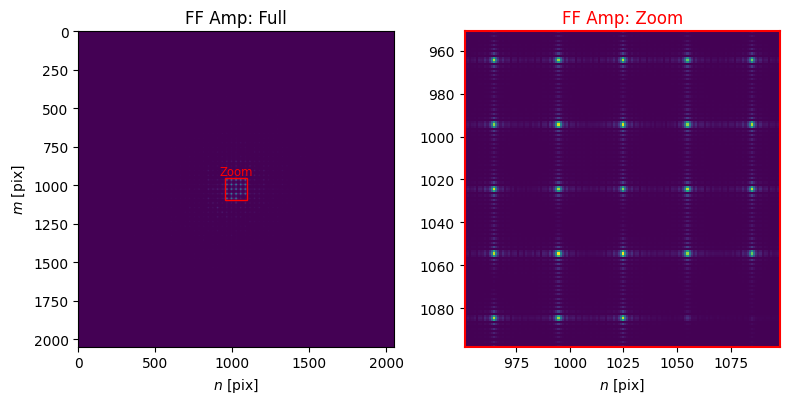

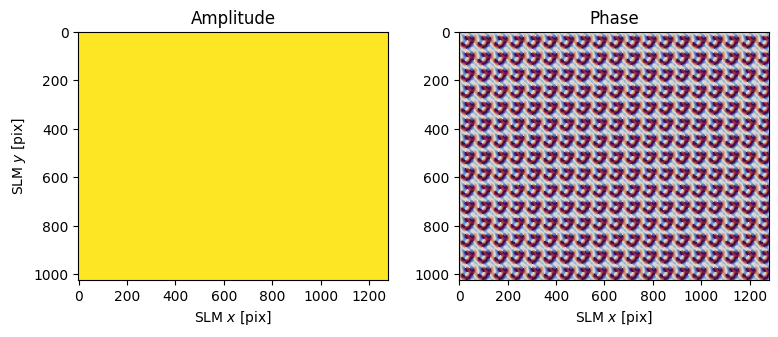

Image grabbed in attempts: 1


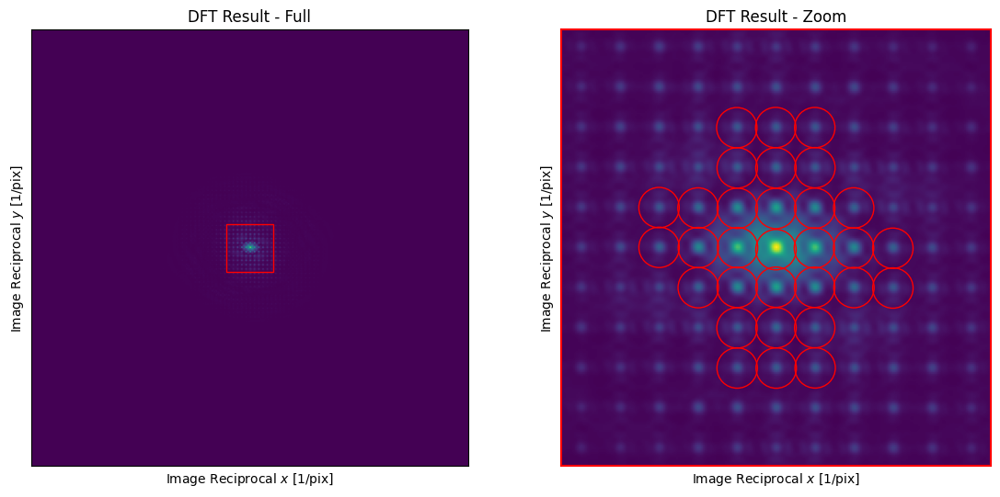

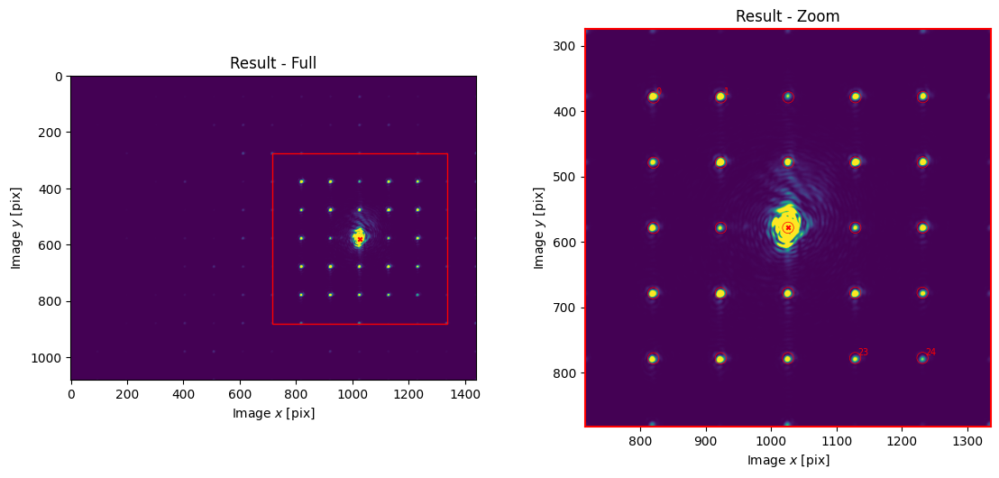

In [5]:
# Perform Fourier Calibration

cam.set_exposure(0.05)
fs.fourier_calibrate(array_shape=[5, 5], array_pitch=[30, 30], plot=True)

cam.set_exposure(.003) # Restore exposure

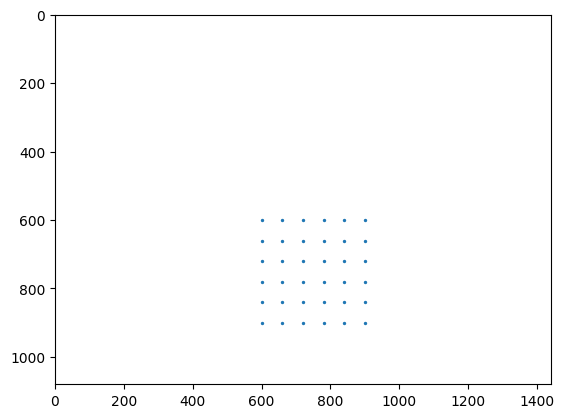

[600 660 720 780 840 900]
[600 660 720 780 840 900]


In [6]:
# Create a 6 x 6

pitch = 60 # pixels

xlist = np.arange(600, 960, pitch)
ylist = np.arange(600, 960, pitch)
xgrid, ygrid = np.meshgrid(xlist, ylist)
square = np.vstack((xgrid.ravel(), ygrid.ravel()))

plt.scatter(square[0, :], square[1, :], s=2)
plt.xlim([0, fs.cam.shape[1]]); plt.ylim([fs.cam.shape[0], 0])
plt.show()
print(xlist)
print(ylist)

In [7]:
# Uniformity tweaks:
# Now, let's enable feedback!
from slmsuite.holography.algorithms import SpotHologram
hologram = SpotHologram(shape=(2048, 2048), spot_vectors=square, basis='ij', cameraslm=fs)
cam.set_exposure(.01) 

# Precondition computationally.
hologram.optimize(
    'WGS-Kim',
    maxiter=70,
    feedback='computational_spot',
    stat_groups=['computational_spot']
)


100%|██████████| 70/70 [02:26<00:00,  2.09s/it]


In [ ]:
# Hone the result with experimental feedback.
hologram.optimize(
    'WGS-Kim',
    maxiter=70,
    feedback='experimental_spot',
    stat_groups=['computational_spot', 'experimental_spot'],
    fixed_phase=False
)

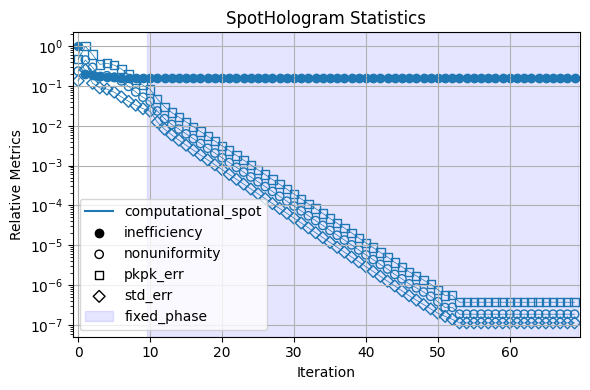

<Axes: title={'center': 'SpotHologram Statistics'}, xlabel='Iteration', ylabel='Relative Metrics'>

In [8]:
hologram.plot_stats()

Image grabbed in attempts: 1


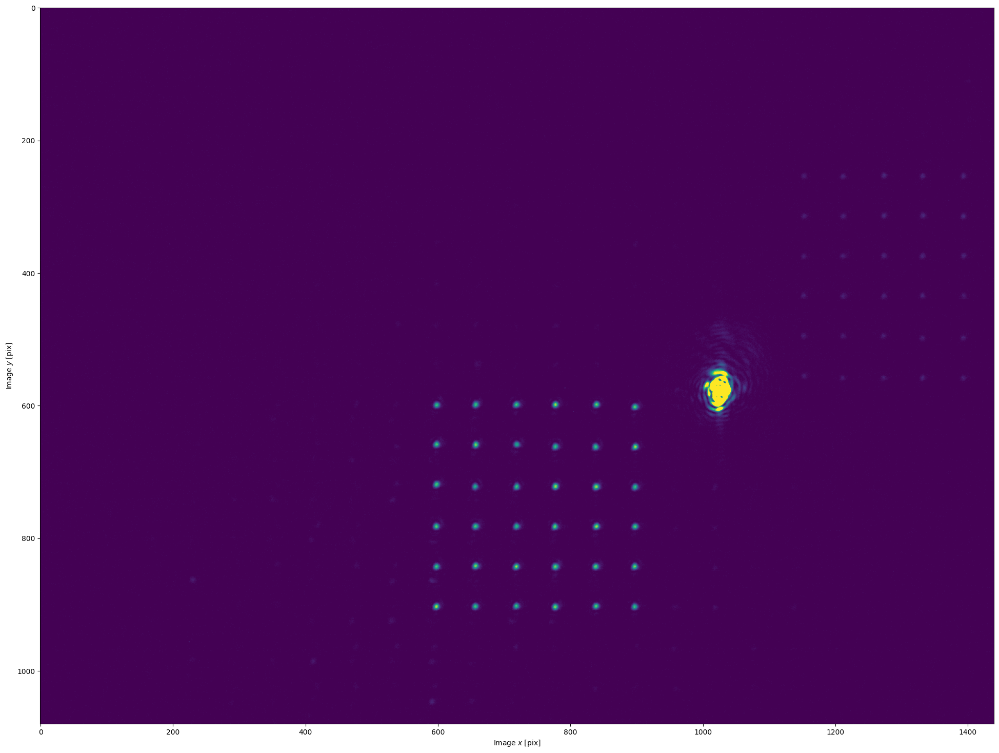

In [9]:
# Taking a look at our result:
base = hologram.extract_phase()
slm.write(phase=base, settle=True)
cam.set_exposure(.001) 
img = cam.get_image()                                # Grab image (this time we dont' have to .write() to the SLM, because the optimization did this already).

plt.figure(figsize=(24,24));    plt.imshow(img, vmax=50)        # This is saturated for visibility.
plt.xlabel("Image $x$ [pix]");  plt.ylabel("Image $y$ [pix]")
plt.show()

In [10]:
def fit(box_size, shiftx, shifty, img, hologram):
    popt_arrays = []
    pcov_arrays = []
    waist_residuals = []
    r_squared_values = []
    spot_coords = hologram.spot_ij
    x_coords = spot_coords[0]
    y_coords = spot_coords[1]
    spot_coords = np.concatenate([x_coords[:,None], y_coords[:,None]], axis=1)

    for p in spot_coords:

        # STEP 1: Crop image.
        cropx, x_len, cropy, y_len = 0, 1000, 0, 1000
        #img = plt.imread(photo)
        

        # STEP 2: Select bounding box.
       
        x1, length, y1, height = p[0] - cropx - int(box_size/2) + shiftx, box_size, p[1] - cropy - int(box_size/2) + shifty, box_size
        params = [x1, length, y1, height, box_size]
       
        # STEP 3: Choose axes and plot result:
        fp_img = img
        fp_img_cropped = fp_img[cropy:cropy+y_len, cropx:cropx+x_len]
        norm, larr, popt, pcov, r_squared = plot_final_array(fp_img_cropped, params)

        wx = popt[1]
        wy = popt[3]
        waist_ratio = wx/wy
        wrs = np.abs(waist_ratio - 1)

        popt_arrays.append(popt)
        pcov_arrays.append(pcov)
        waist_residuals.append(wrs)
        r_squared_values.append(r_squared)
    return popt_arrays, r_squared_values, waist_residuals

def fit_plots(box_size, shiftx, shifty, img, hologram):
    popt_arrays = []
    pcov_arrays = []
    waist_residuals = []
    r_squared_values = []
    # User input
    #box_size = 15
    #spot_coords = np.array([[60, 60, 60, 60, 60, 60, 60], [90, 150, 210, 270, 330, 390, 450]])
    spot_coords = hologram.spot_ij
    x_coords = spot_coords[0]
    y_coords = spot_coords[1]
    spot_coords = np.concatenate([x_coords[:,None], y_coords[:,None]], axis=1)

    for p in spot_coords:
        
        # STEP 0: Upload image.

        fig0,ax0 = plt.subplots(1, 2, figsize=(16,6))
        ax0[0].imshow(img)
        ax0[0].set_title("Original Image")

        # STEP 1: Crop image.
        cropx, x_len, cropy, y_len = 0, 1000, 0, 1000
        #img = plt.imread(photo)
        img_cropped = img[cropy:cropy+y_len, cropx:cropx+x_len]

        # STEP 2: Select bounding box.
        #box_size = 60
        x1, length, y1, height = p[0] - cropx - int(box_size/2) + shiftx, box_size, p[1] - cropy - int(box_size/2) + shifty, box_size
        params = [x1, length, y1, height, box_size]
        rect1 = patches.Rectangle((x1, y1), length, height, linewidth=1, edgecolor="cyan", facecolor="none")
        ax0[1].add_patch(rect1)
        ax0[1].text(x1, y1-2,'Sample', c="cyan")

        # Display cropped image
        ax0[1].imshow(img_cropped)
        ax0[1].set_title("(Non-normalized) Cropped Image")

        # Also add the rectangle to the other image
        rect_corrected = patches.Rectangle((x1+cropx, y1+cropy), length, height, linewidth=1, edgecolor="cyan", facecolor="none")
        ax0[0].add_patch(rect_corrected)

        # STEP 3: Choose axes and plot result:
        fp_img = img
        fp_img_cropped = fp_img[cropy:cropy+y_len, cropx:cropx+x_len]
        
        norm, larr, popt, pcov, r_squared = plot_final_array_plots(fp_img_cropped, params)
        
        wx = popt[1]
        wy = popt[3]
        waist_ratio = wx/wy
        wrs = np.abs(waist_ratio - 1)

        popt_arrays.append(popt)
        pcov_arrays.append(pcov)
        waist_residuals.append(wrs)
        r_squared_values.append(r_squared)
    return popt_arrays, r_squared_values, waist_residuals

In [11]:
# Histograms
def plot_histograms(popt_arrays):
    # Histograms

    #Extract all waists
    wxs = []
    wys = []
    a_arr = []
    for popt in popt_arrays:
        a_arr.append(popt[0])
        wxs.append(popt[1])
        wys.append(popt[3])

    wxs = np.array(wxs)
    wys = np.array(wys)
    a_arr = np.array(a_arr)

    p4 = np.sqrt(a_arr/wxs**2)
    p4 = p4/np.mean(p4)

    return wxs, wys, a_arr

# Histograms
def plot_histograms_plots(popt_arrays):
    # Histograms
    hfig, hax = plt.subplots(1, 5, figsize=(20,5))

    plt.suptitle("Full Array Fit Statistics", fontsize=20)

    #Extract all waists
    wxs = []
    wys = []
    a_arr = []
    for popt in popt_arrays:
        a_arr.append(popt[0])
        wxs.append(popt[1])
        wys.append(popt[3])

    wxs = np.array(wxs)
    wys = np.array(wys)
    a_arr = np.array(a_arr)

    hax[0].hist(wxs, color= "r", label="x-waist")
    hax[0].set_xlabel("x-waist (um)")
    hax[0].set_title("mean = {}um, median = {}um, std dev = {}um".format(round(np.mean(wxs),2), round(np.median(wxs),2), round(np.std(wxs),2)), fontsize=8)

    hax[1].hist(wys, color="g", label="y-waist")
    hax[1].set_xlabel("y-waist (um)")
    hax[1].set_title("mean = {}um, median = {}um, std dev = {}um".format(round(np.mean(wys),2), round(np.median(wys),2), round(np.std(wys),2)), fontsize=8)

    hax[2].hist(a_arr, color="gray", label="amplitude")
    hax[2].set_xlabel("amplitude (arb)")
    hax[2].set_title("mean = {}, median = {}, std dev = {}".format(round(np.mean(a_arr),2), round(np.median(a_arr),2), round(np.std(a_arr),2)), fontsize=8)

    hax[3].hist(a_arr/np.mean(a_arr), color="pink")
    hax[3].set_xlabel("amp/mean(amp)")
    hax[3].set_title("amp/mean(amp)")

    p4 = np.sqrt(a_arr/wxs**2)
    p4 = p4/np.mean(p4)
    hax[4].hist(p4, color="purple")
    hax[4].set_xlabel("sqrt(amp/wxs^2)")
    hax[4].set_title("mean = {}, median = {}, std dev = {}".format(round(np.mean(p4),2), round(np.median(p4),2), round(np.std(p4),2)), fontsize=8)

    return wxs, wys, a_arr

In [12]:
def nelder_mead(f, initial_point, initial_step, tolerance, maxiter, alpha, gamma, rho, sigma):
    
    # Create the initial simplex

    # Initialize simplex with the initial point
    current_simplex = [[initial_point, f(initial_point)]]
    # Dimension of each point
    dim = len(initial_point)
    
    # Add initial step to each dimension of initial point to create initial simplex
    for i in range(dim):
        initial_point_copy = np.copy(initial_point)
        initial_point_copy[i] = initial_point_copy[i] + initial_step
        current_simplex.append([initial_point_copy, f(initial_point_copy)])

    print(current_simplex)

    iter = 0

    while True:
        
        iter += 1
        print(iter)

        # Order the points by function value
        ordered_simplex = sorted(current_simplex, key=lambda x: float(x[1]))
        print(ordered_simplex[0])
        print(ordered_simplex[-1])
        # Check for termination
        if iter == maxiter:
            # Return best point and function value
            return ordered_simplex
        else:
            # Calculate centroid
            centroid_point = centroid(ordered_simplex[:-1])

            # Calculate reflected point
            worst_point = ordered_simplex[-1][0]
            reflected_point = reflected(centroid_point, alpha, worst_point)

            best_point_value = ordered_simplex[0][1]
            second_worst_point_value = ordered_simplex[-2][1]
            reflected_point_value = f(reflected_point)

            if best_point_value <= reflected_point_value < second_worst_point_value:
                # Replace worst with reflected point
                ordered_simplex.pop()
                ordered_simplex.append([reflected_point, reflected_point_value])
                current_simplex = ordered_simplex
                print('Swapped worst with reflected')
                continue
            elif reflected_point_value < best_point_value:

                # Calculate expanded point
                expanded_point = expanded(centroid_point, gamma, reflected_point)
                expanded_point_value = f(expanded_point)

                if expanded_point_value < reflected_point_value:
                    # Replace worst with expanded
                    ordered_simplex.pop()
                    ordered_simplex.append([expanded_point, expanded_point_value])
                    current_simplex = ordered_simplex
                    print('Swapped worst with expanded')
                    continue
                else:
                    ordered_simplex.pop()
                    ordered_simplex.append([reflected_point, reflected_point_value])
                    current_simplex = ordered_simplex
                    print('Swapped worst with reflected')
                    continue    
            else:
                worst_point_value = ordered_simplex[-1][1]
                if reflected_point_value < worst_point_value:
                    # Calculate outside contracted point
                    contracted_point = contraction_outside(centroid_point, rho, reflected_point)
                    contracted_point_value = f(contracted_point)

                    if contracted_point_value < reflected_point_value:
                        # Replace worst with contracted
                        ordered_simplex.pop()
                        ordered_simplex.append([contracted_point, contracted_point_value])
                        current_simplex = ordered_simplex
                        print('Swapped worst with outside contracted')
                        continue
                    else:
                        # Replace all but the best point with shrunk points
                        current_simplex = shrink(ordered_simplex, sigma, f)
                        print("Shrunk points")
                        continue
                        
                elif reflected_point_value >= worst_point_value:
                    # Calculate inside contracted point
                    contracted_point = contraction_inside(centroid_point, rho, worst_point)
                    contracted_point_value = f(contracted_point)

                    if contracted_point_value < worst_point_value:
                        # Replace worst with contracted
                        ordered_simplex.pop()
                        ordered_simplex.append([contracted_point, contracted_point_value])
                        current_simplex = ordered_simplex
                        print('Swapped worst with inside contracted')
                        continue
                    else:
                        # Replace all but the best point with shrunk points
                        current_simplex = shrink(ordered_simplex, sigma, f)
                        print('Shrunk points')
                        continue       

def centroid(simplex):
    num_points = len(simplex)
    dim_points = len(simplex[0][0])
    point_sum = np.zeros(dim_points)
    for p in simplex:
        point_sum = point_sum + p[0]
    return point_sum / num_points

def reflected(centroid, alpha, worst_point):

    return centroid + alpha * (centroid - worst_point)

def expanded(centroid, gamma, reflected):
    return centroid + gamma * (reflected - centroid)

def contraction_outside(centroid, rho, reflected):
    return centroid + rho * (reflected - centroid)

def contraction_inside(centroid, rho, worst):
    return centroid + rho * (worst - centroid)

def shrink(simplex, sigma, f):
    best_point = simplex[0][0]
    for p in simplex[1:]:
        p[0] = best_point + sigma * (p[0] - best_point)
        p[1] = f(p[0])

    return simplex

def termination(simplex):
    return 1

In [13]:
# THE FUNCTION WE ARE PUTTING INTO NELDER MEAD

# Calculate how close an array is to being uniform based on some linear combination of zernikes

# Takes in a 10D vector containing the coeff for each zernike
def loss_function(p):
    
    # Get the zernike
    zernike_sum_phase = toolbox.phase.zernike_sum(
        grid=slm,
        weights=(
            ((0, 0),  p[0]),                                   
            ((1, 1),  p[1]),
            ((1, 0),  p[2]),
            ((2, 2),  p[3]),
            ((2, 1),  p[4]),
            ((2, 0),  p[5]),
            ((3, 3),  p[6]),
            ((3, 2),  p[7]),
            ((3, 1),  p[8]),
            ((3, 0),  p[9])
        ),
        aperture="circular"
    )

    # Add the zernike to the base
    base_phase = base
    phase = base_phase + zernike_sum_phase
    
    # Write to the SLM
    slm.write(phase, settle=True)             
    # Take the camera image
    cam.set_exposure(.013)
    img = cam.get_image()                                        
    
    # Run the fit over all the spots
    popt_arrays, r_squared_values, waist_residuals = fit(60, 0, 0, img / 1024, hologram=hologram)
    # Display hologram of fit statistics
    wxs, wys, a_arr = plot_histograms(popt_arrays)
    # Calculate the loss from the fit statistics
    loss = -np.mean(r_squared_values) + 10 * np.std(a_arr) / np.mean(a_arr)
    
    # Return the loss
    return loss

In [14]:
# THE FUNCTION WE ARE PUTTING INTO NELDER MEAD

# Calculate how close an array is to being uniform based on some linear combination of zernikes

# Takes in a 10D vector containing the coeff for each zernike
def plot_function(p):
    
    # Get the zernike
    zernike_sum_phase = toolbox.phase.zernike_sum(
        grid=slm,
        weights=(
            ((0, 0),  p[0]),                                   
            ((1, 1),  p[1]),
            ((1, 0),  p[2]),
            ((2, 2),  p[3]),
            ((2, 1),  p[4]),
            ((2, 0),  p[5]),
            ((3, 3),  p[6]),
            ((3, 2),  p[7]),
            ((3, 1),  p[8]),
            ((3, 0),  p[9])
        ),
        aperture="circular"
    )

    # Add the zernike to the base
    base_phase = base
    phase = base_phase + zernike_sum_phase
    
    # Write to the SLM
    slm.write(phase, settle=True)             
    # Take the camera image
    cam.set_exposure(.013)
    img = cam.get_image()                                        
    
    # Run the fit over all the spots
    popt_arrays, r_squared_values, waist_residuals = fit_plots(60, 0, 0, img / 1024, hologram=hologram)
    # Display hologram of fit statistics
    wxs, wys, a_arr = plot_histograms_plots(popt_arrays)
    # Calculate the loss from the fit statistics
    loss = -np.mean(r_squared_values) + 10 * np.std(a_arr) / np.mean(a_arr)
    
    print(np.sum(r_squared_values))
    print(np.sum(waist_residuals))
    print(np.std(wxs))
    print(np.std(wys))
    print(np.std(a_arr))
    # Return the loss
    return loss

Image grabbed in attempts: 1


C:\Users\NaCs 2.0\AppData\Local\Temp\ipykernel_12148\3916672202.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig0,ax0 = plt.subplots(1, 2, figsize=(16,6))


35.4558246166879
1.5307969195613258
0.8961825141374208
0.5436684310562436
0.05042521382555072


0.0382092948481948

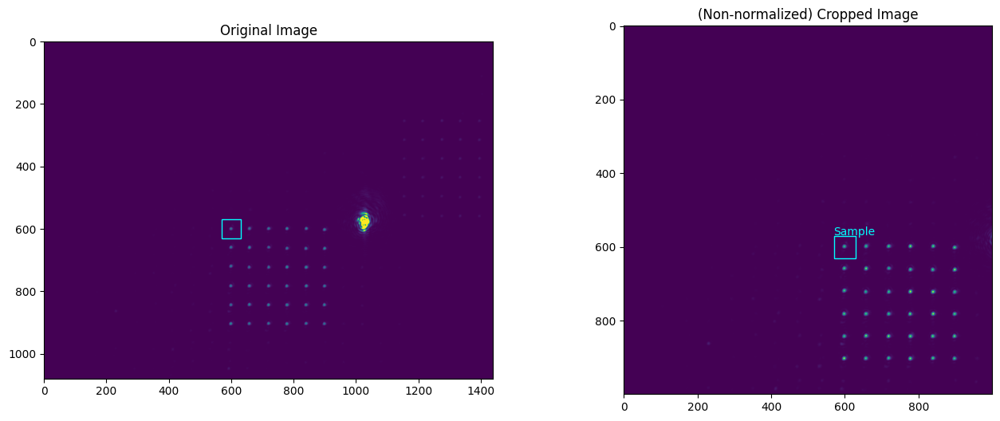

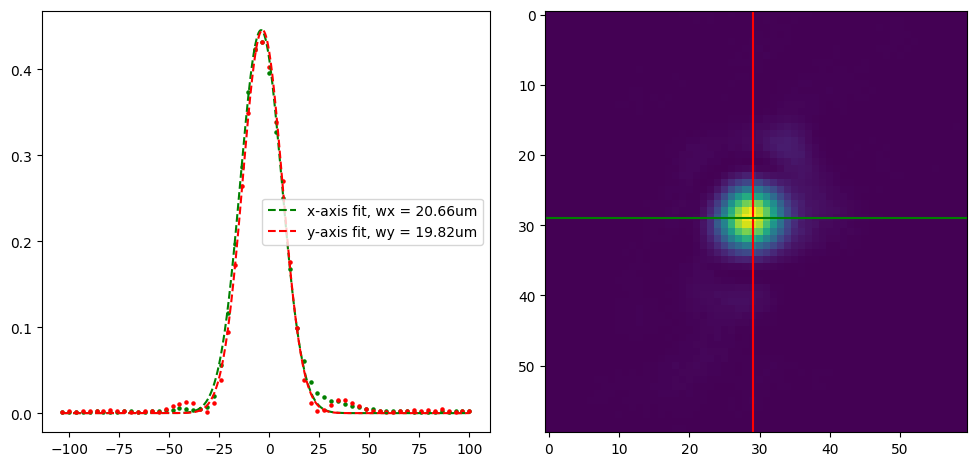

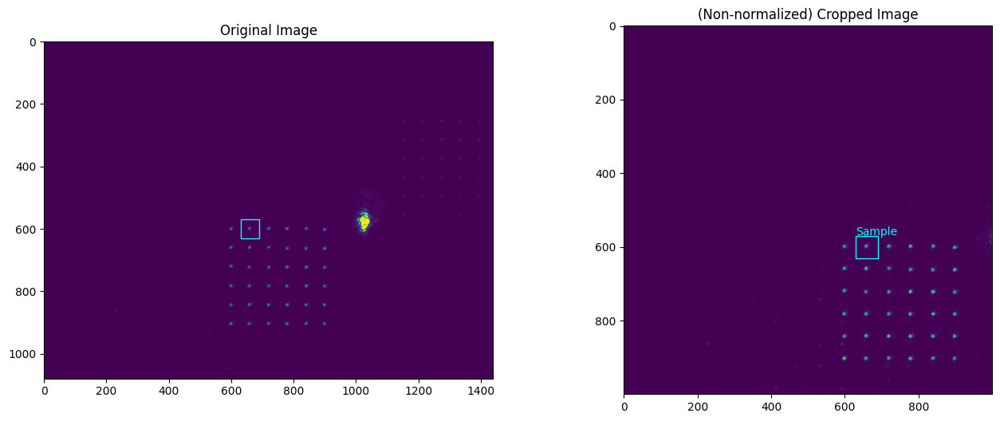

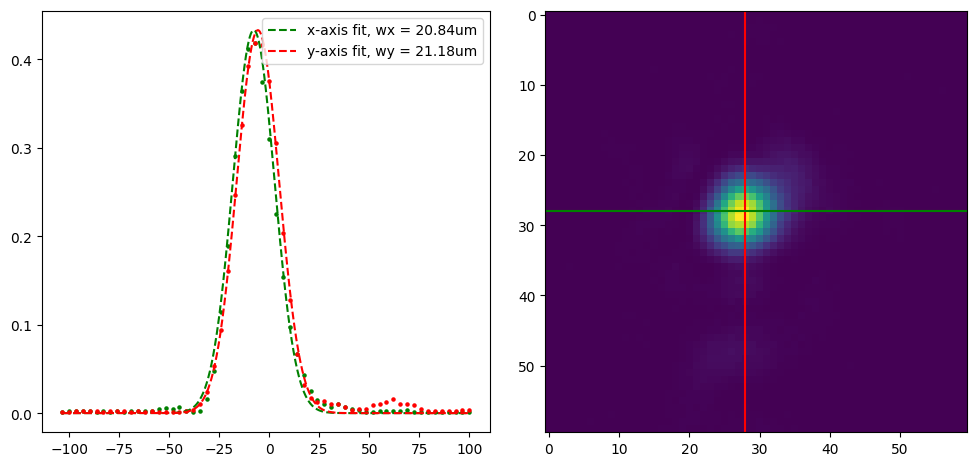

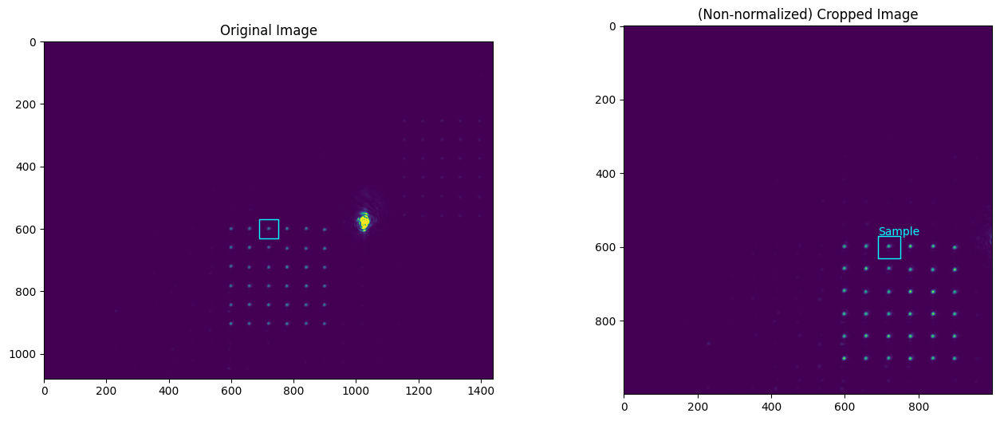

...

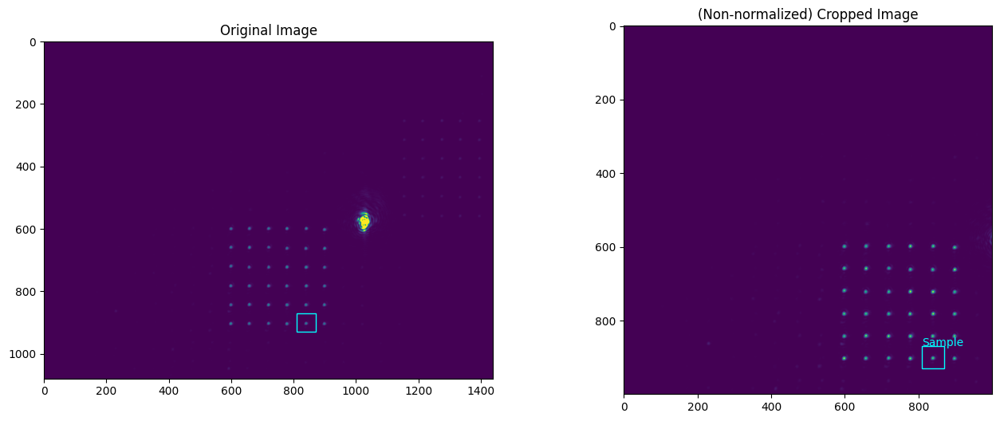

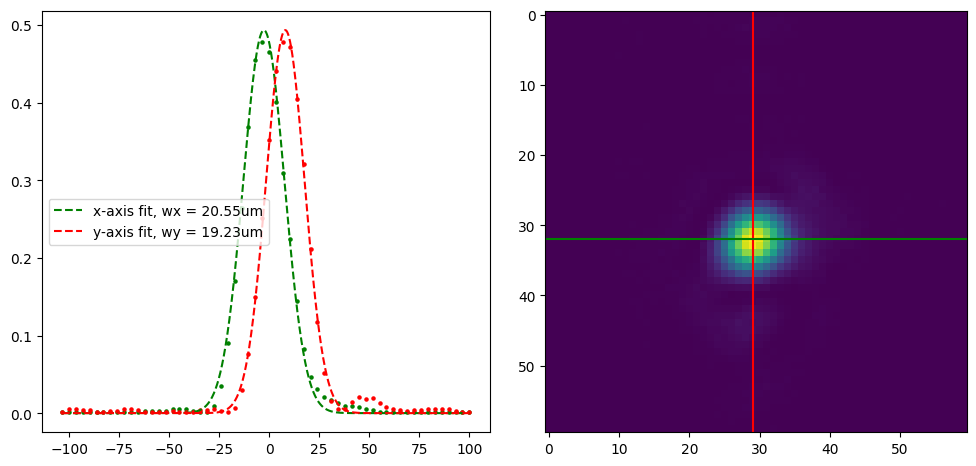

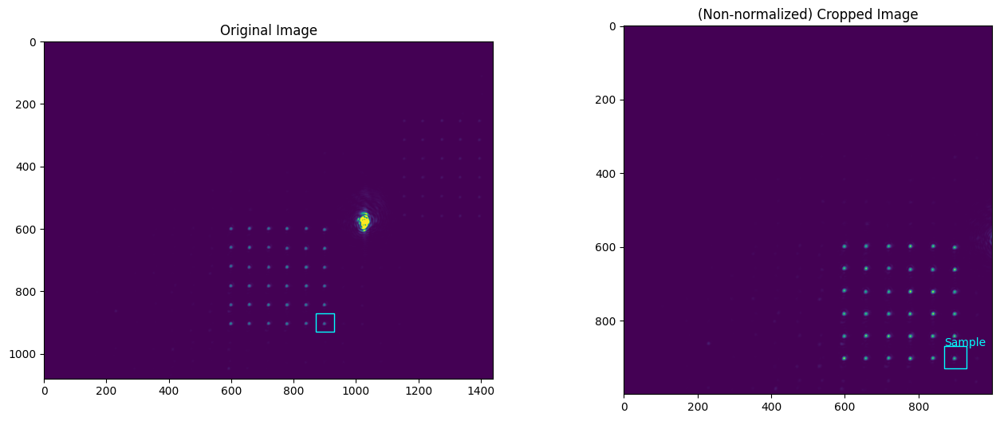

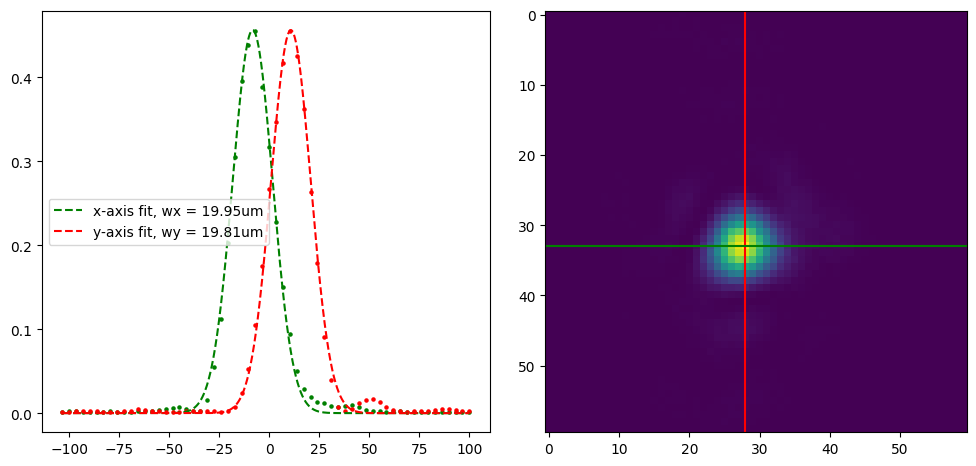

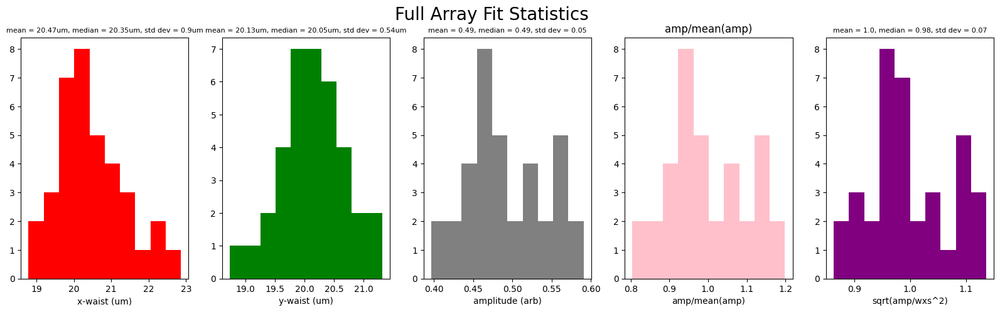

In [19]:
# Get the stats with no zernikes
p = [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]
plot_function(p)

In [15]:
initial_point = np.array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
initial_step = 3.5
maxiter = 100
alpha = 1
gamma = 2
rho = 0.5
sigma = 0.5
final_simplex = nelder_mead(loss_function, initial_point, initial_step, 1, maxiter, alpha, gamma, rho, sigma)

Image grabbed in attempts: 1
Image grabbed in attempts: 1
Image grabbed in attempts: 1
Image grabbed in attempts: 1
Image grabbed in attempts: 1
Image grabbed in attempts: 1
Image grabbed in attempts: 1
Image grabbed in attempts: 1
Image grabbed in attempts: 1
Image grabbed in attempts: 1
Image grabbed in attempts: 1
[[array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]), 0.06684299874402755], [array([3.5, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ]), 1.974537486226876], [array([0. , 3.5, 0. , 0. , 0. , 0. , 0. , 0. , 0. , 0. ]), 0.08745433856315787], [array([0. , 0. , 3.5, 0. , 0. , 0. , 0. , 0. , 0. , 0. ]), 1.4798678086132777], [array([0. , 0. , 0. , 3.5, 0. , 0. , 0. , 0. , 0. , 0. ]), 5.1980720381303245], [array([0. , 0. , 0. , 0. , 3.5, 0. , 0. , 0. , 0. , 0. ]), 4.973084313696891], [array([0. , 0. , 0. , 0. , 0. , 3.5, 0. , 0. , 0. , 0. ]), 9.574157971635952], [array([0. , 0. , 0. , 0. , 0. , 0. , 3.5, 0. , 0. , 0. ]), 6.829244393199308], [array([0. , 0. , 0. , 0. , 0. , 0. , 0. , 3

In [ ]:
final_simplex[0][0]
#final_simplex = np.array([0.5677004, 1.08640392, -0.86870066, 0.12773411, 0.39490835, 0.61080827, 0.46329439, -1.15338756, 0.478536, 1.04677298])

Image grabbed in attempts: 1


C:\Users\NaCs 2.0\AppData\Local\Temp\ipykernel_12148\3916672202.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig0,ax0 = plt.subplots(1, 2, figsize=(16,6))


34.929476987980074
1.5901232110104604
0.6717243139612827
0.875894205691775
0.026090748138556493


-0.24813428479859456

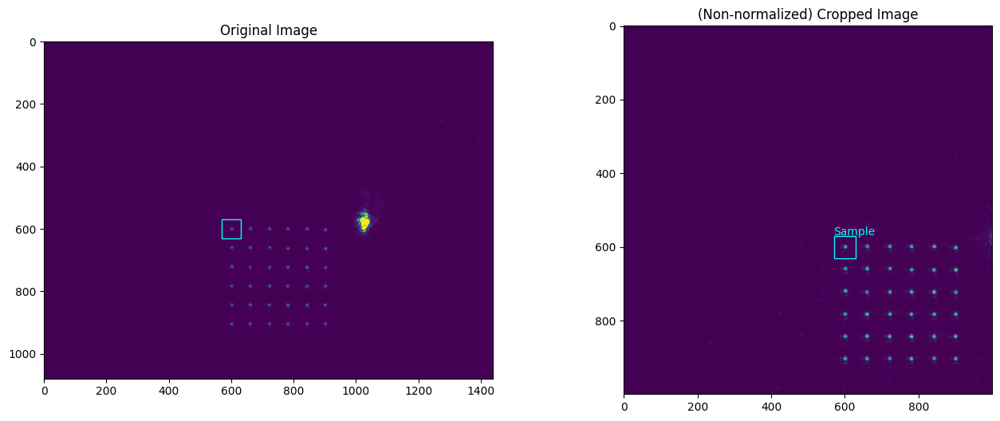

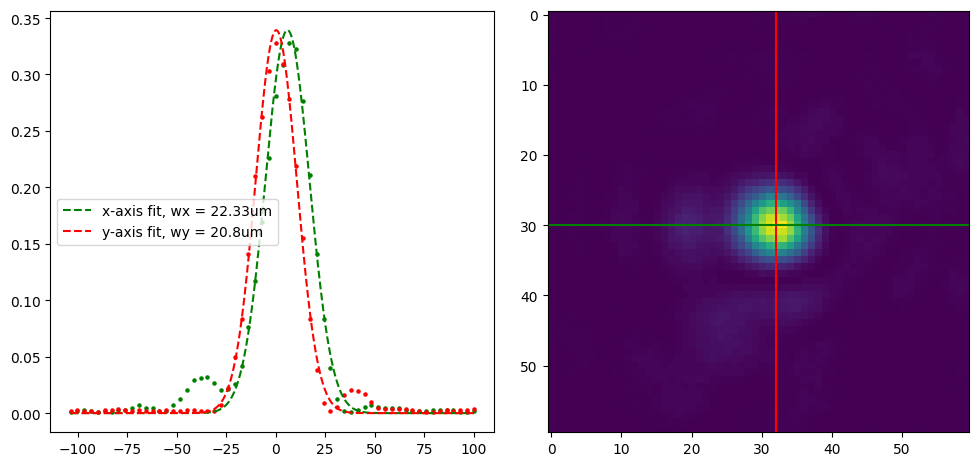

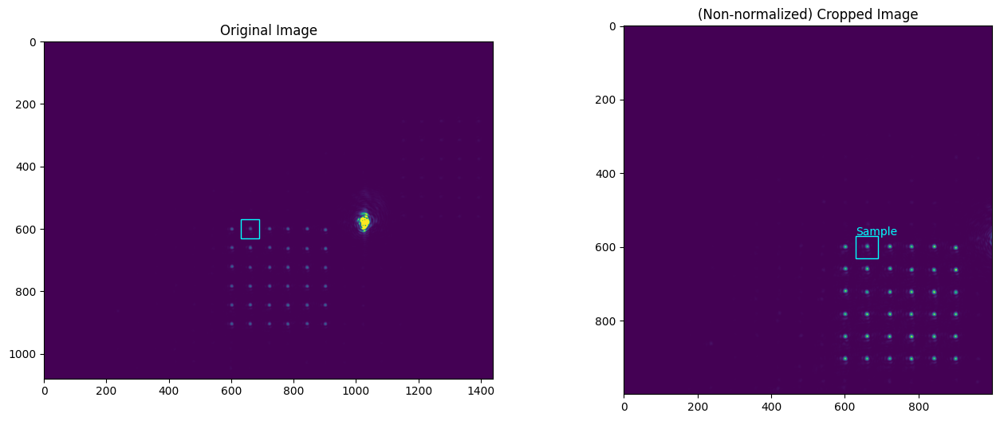

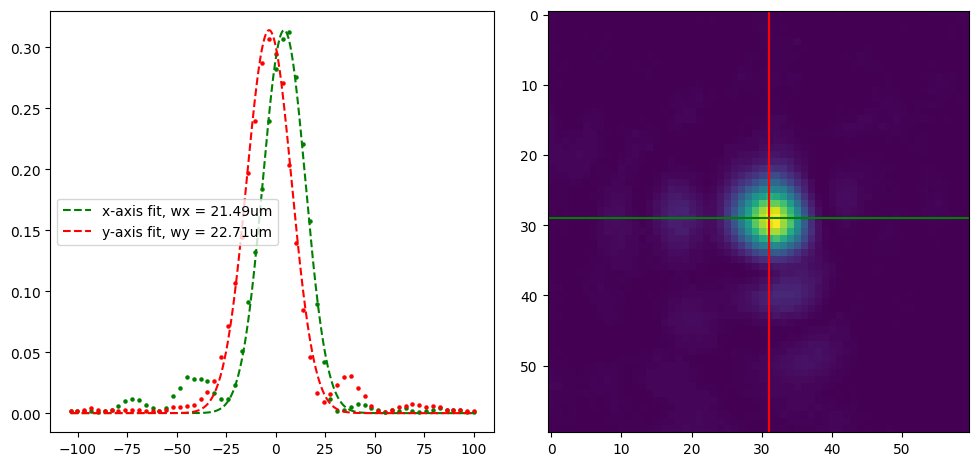

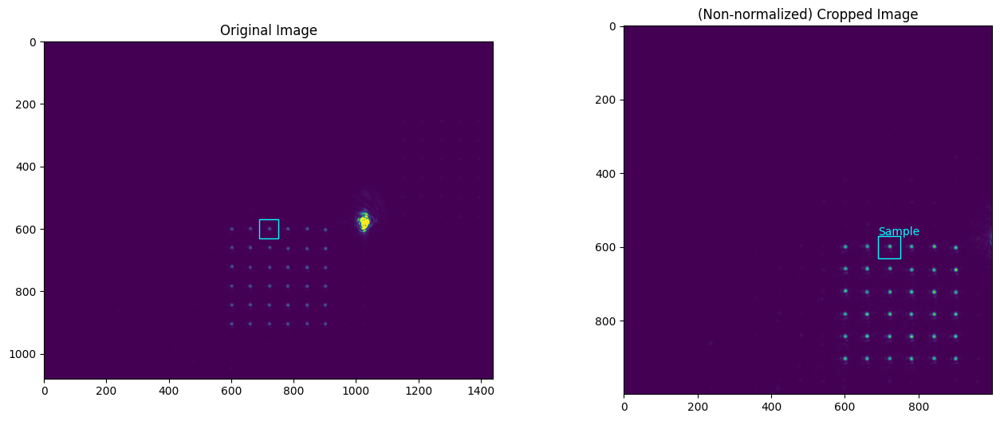

...

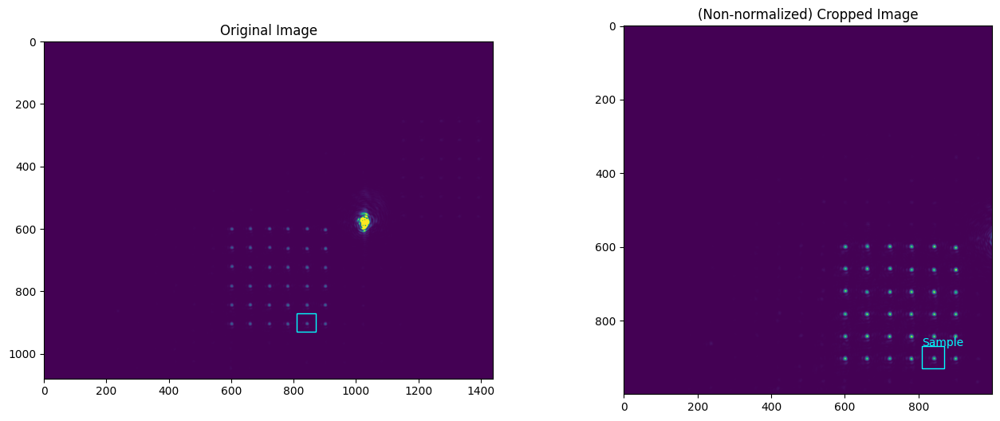

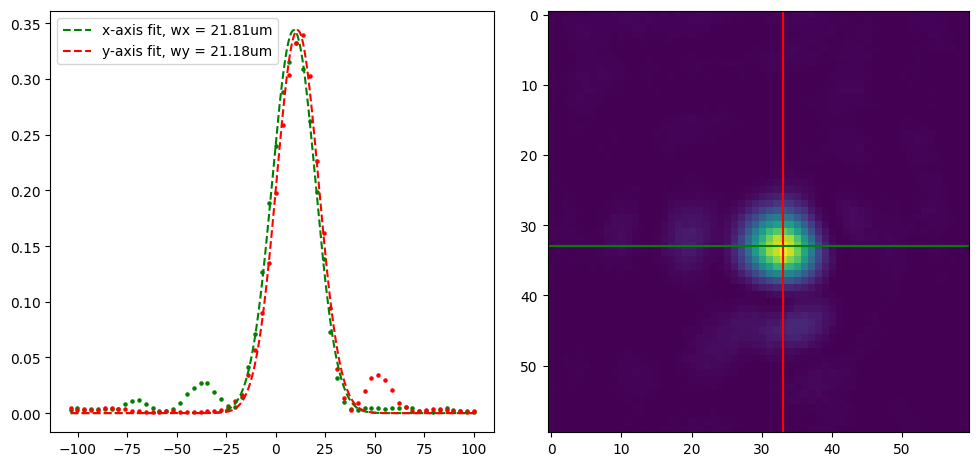

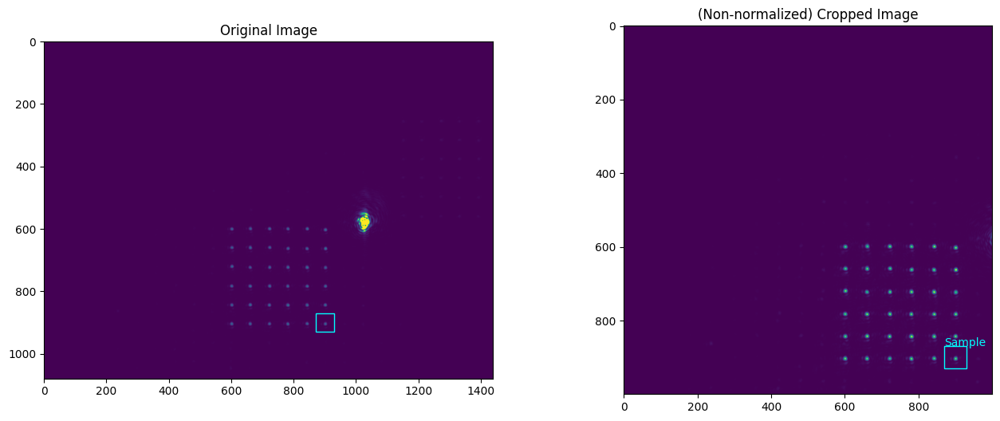

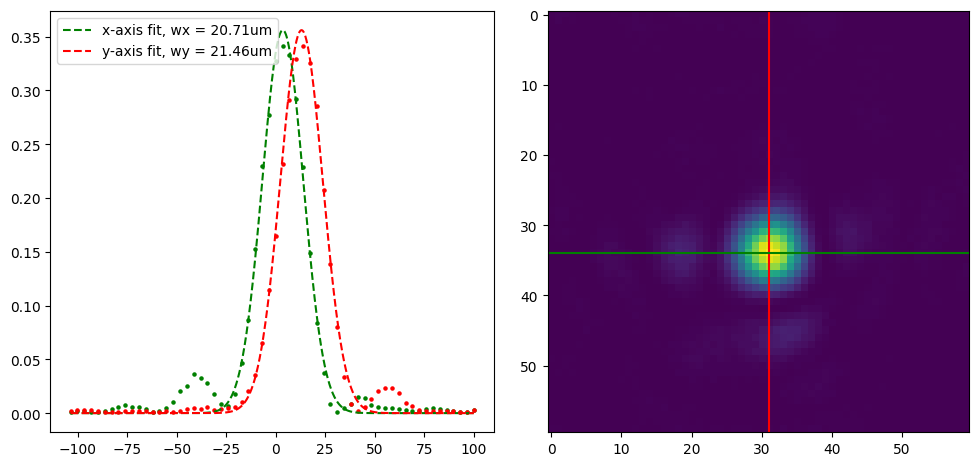

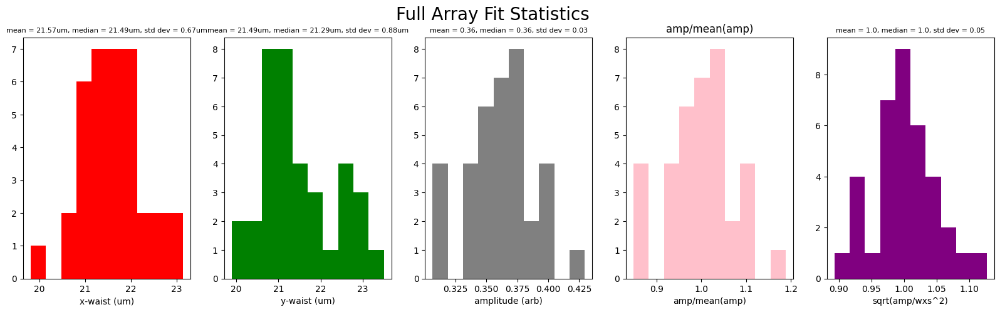

In [17]:

final_point = final_simplex[0][0]
plot_function(final_point)